In [1]:
from utils import *
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix,accuracy_score
x,y = load_data('ex2data1.txt')

ModuleNotFoundError: No module named 'utils'

In [ ]:
plot_data(x,y,pos_label='Admitted',neg_label='Not Admitted')
plt.ylabel('Exam 2 score')
plt.xlabel('Exam 1 score')
plt.legend()
plt.show()

In [51]:
def logistic(x,y,iterations  = 1000000 ,learning_rate = 0.001,stopping = 1e-6):
    w = np.zeros(x.shape[1])
    b = 0
    it = []
    cost = []
    weight = []
    previous_cost = 0
    n = float(len(x))
    for i in range(iterations):
        z = np.dot(x,w)+b
        h = 1/(1+np.exp(-z))
        cos = -(np.mean((y*np.log(h)) + ((1-y)*np.log(1-h))))
        it.append(i)
        cost.append(cos)
        weight.append(w)
        if i > 0:
            if np.abs(cos - previous_cost) < stopping:
                break
        gradient1 =(1/n)*(np.dot(x.T,(h-y)))
        gradient2 = (1/n)*np.sum(h-y)
        w = w - learning_rate * gradient1
        b = b - learning_rate * gradient2
        previous_cost = cos
        print('iteration: ',i,'current cost :',cos,'current weight and bias :',w,b)
    plt.plot(it,cost)
    return w,b

iteration:  0 current cost : 0.6931471805599453 current weight and bias : [0.01200922 0.01126284] 0.0001
iteration:  1 current cost : 0.6982906893667754 current weight and bias : [0.00247583 0.00090522] -0.00011820920713240085
iteration:  2 current cost : 0.6597117632164304 current weight and bias : [0.01062598 0.00843307] -7.353481483942039e-05
iteration:  3 current cost : 0.6616272696122697 current weight and bias : [0.00388686 0.00098788] -0.0002487727722864776
iteration:  4 current cost : 0.6488615344619068 current weight and bias : [0.01033829 0.00692578] -0.00022806166984917748
iteration:  5 current cost : 0.6496960933384357 current weight and bias : [0.00493104 0.00091228] -0.00038262559374718254
iteration:  6 current cost : 0.6431098658230963 current weight and bias : [0.01028944 0.00584796] -0.0003771863804929565
iteration:  7 current cost : 0.643465208403156 current weight and bias : [0.00575949 0.0007979 ] -0.0005180185323069515
iteration:  8 current cost : 0.639525229130456

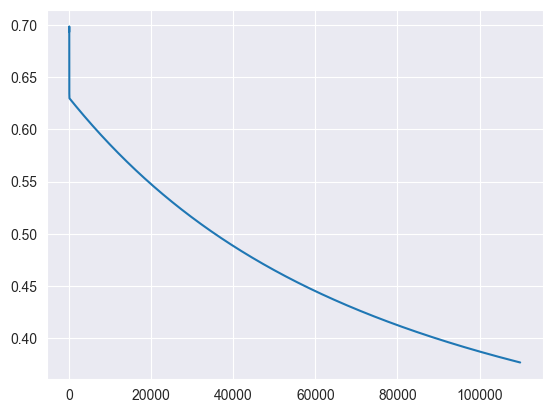

In [52]:
w,b = logistic(x,y)

[[31  9]
 [ 0 60]]
0.91


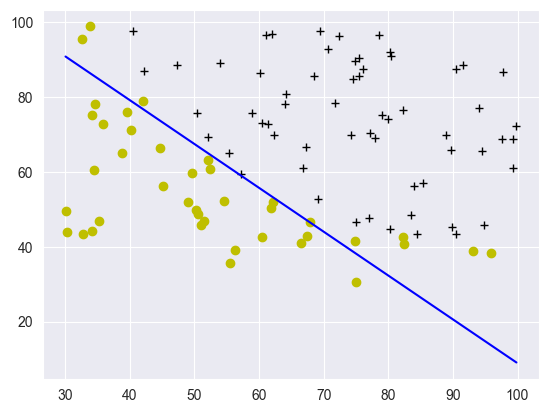

In [56]:
def predict(x,w,b):
    z = np.dot(x,w)+b
    h = 1/(1+np.exp(-z))
    h = np.where(h>0.5,1,0)
    return h
p = predict(x,w,b)
print(confusion_matrix(y,p))
print(accuracy_score(y,p))
plot_decision_boundary(w,b,x,y)
plt.show()


In [54]:
from sklearn.linear_model import LogisticRegression
classifier=LogisticRegression()
classifier.fit(x,y)
y_pred=classifier.predict(x)
print(confusion_matrix(y,p))
accuracy_score(y,y_pred)

[[31  9]
 [ 0 60]]


0.89